In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium

In [2]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [3]:
a1 = pd.read_csv('CorkCityData/A_2018.01.25_16.33.53.csv')
a2 = pd.read_csv('CorkCityData/A_2018.01.25_17.27.30.csv')
a3 = pd.read_csv('CorkCityData/A_2018.01.25_18.02.07.csv')
a4 = pd.read_csv('CorkCityData/A_2018.01.25_19.50.40.csv')
a5 = pd.read_csv('CorkCityData/A_2018.01.27_10.58.49.csv')
a6 = pd.read_csv('CorkCityData/A_2018.01.27_11.12.23.csv')
a7 = pd.read_csv('CorkCityData/A_2018.01.27_12.10.00.csv')

b1 = pd.read_csv('CorkCityData/B_2018.01.25_16.33.45.csv')
b2 = pd.read_csv('CorkCityData/B_2018.01.25_17.27.27.csv')
b3 = pd.read_csv('CorkCityData/B_2018.01.25_18.02.03.csv')
b4 = pd.read_csv('CorkCityData/B_2018.01.25_19.50.43.csv')
b5 = pd.read_csv('CorkCityData/B_2018.01.27_10.58.49.csv')
b6 = pd.read_csv('CorkCityData/B_2018.01.27_11.12.22.csv')
b7 = pd.read_csv('CorkCityData/B_2018.01.27_12.09.59.csv')

In [4]:
ab = pd.concat([a1, a2, a3, a4, a5, a6, a7, b1, b2, b3, b4, b5, b6, b7], ignore_index=True)

In [5]:
ab.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7803 entries, 0 to 7802
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Timestamp             7803 non-null   object 
 1   Longitude             7803 non-null   float64
 2   Latitude              7803 non-null   float64
 3   Speed                 7803 non-null   int64  
 4   Operatorname          7803 non-null   object 
 5   CellID                7803 non-null   int64  
 6   NetworkMode           7803 non-null   object 
 7   RSRP                  7803 non-null   int64  
 8   RSRQ                  7803 non-null   object 
 9   SNR                   7803 non-null   object 
 10  CQI                   7803 non-null   object 
 11  RSSI                  7803 non-null   object 
 12  DL_bitrate            7803 non-null   int64  
 13  UL_bitrate            7803 non-null   int64  
 14  State                 7803 non-null   object 
 15  NRxRSRP              

In [6]:
ab['ServingCell_Lon'].replace({'-': np.nan}, inplace=True)
ab['ServingCell_Lat'].replace({'-': np.nan}, inplace=True)
ab['ServingCell_Lon'].fillna(method='ffill', inplace=True)
ab['ServingCell_Lat'].fillna(method='ffill', inplace=True)
ab['ServingCell_Lon'].fillna(method='bfill', inplace=True)
ab['ServingCell_Lat'].fillna(method='bfill', inplace=True)

In [7]:
def ctgrzrsrp(dfname, columnname):
    a = dfname[columnname] >= -75
    b = (dfname[columnname] < -75) & (dfname[columnname] >= -80)
    c = (dfname[columnname] < -80) & (dfname[columnname] >= -85)
    d = (dfname[columnname] < -85) & (dfname[columnname] >= -90)
    e = (dfname[columnname] < -90) & (dfname[columnname] >= -95)
    f = (dfname[columnname] < -95) & (dfname[columnname] >= -100)
    g = (dfname[columnname] < -100) & (dfname[columnname] >= -105)
    h = (dfname[columnname] < -105) & (dfname[columnname] >= -110)
    i = (dfname[columnname] < -110) & (dfname[columnname] >= -115)
    j = (dfname[columnname] < -115) & (dfname[columnname] >= -120)
    k = (dfname[columnname] < -120) & (dfname[columnname] >= -125)
    l = dfname[columnname] < -125
    
    dfname['Sort_'+columnname] = None
    dfname.loc[a, 'Sort_'+columnname] = 'Better than -75'
    dfname.loc[b, 'Sort_'+columnname] = '-75 to -80'
    dfname.loc[c, 'Sort_'+columnname] = '-80 to -85'
    dfname.loc[d, 'Sort_'+columnname] = '-85 to -90'
    dfname.loc[e, 'Sort_'+columnname] = '-90 to -95'
    dfname.loc[f, 'Sort_'+columnname] = '-95 to -100'
    dfname.loc[g, 'Sort_'+columnname] = '-100 to -105'
    dfname.loc[h, 'Sort_'+columnname] = '-105 to -110'
    dfname.loc[i, 'Sort_'+columnname] = '-110 to -115'
    dfname.loc[j, 'Sort_'+columnname] = '-115 to -120'
    dfname.loc[k, 'Sort_'+columnname] = '-120 to -125'
    dfname.loc[l, 'Sort_'+columnname] = 'Worse than -125'

In [8]:
def cal_distance(lon1, lat1, lon2, lat2):

    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2

    c = 2 * np.arcsin(np.sqrt(a))
    m = 6367 * c * 1000
    return m

In [9]:
ctgrzrsrp(ab, 'RSRP')

In [10]:
lat1 = ab['ServingCell_Lat']
lon1 = ab['ServingCell_Lon']
lat2 = ab['Latitude']
lon2 = ab['Longitude']

In [11]:
ab.loc[:, 'Distance'] = cal_distance(lon1.astype(np.float64), lat1.astype(np.float64), lon2, lat2)

In [12]:
ab.columns

Index(['Timestamp', 'Longitude', 'Latitude', 'Speed', 'Operatorname', 'CellID',
       'NetworkMode', 'RSRP', 'RSRQ', 'SNR', 'CQI', 'RSSI', 'DL_bitrate',
       'UL_bitrate', 'State', 'NRxRSRP', 'NRxRSRQ', 'ServingCell_Lon',
       'ServingCell_Lat', 'ServingCell_Distance', 'Sort_RSRP', 'Distance'],
      dtype='object')

In [13]:
colordict = {'Better than -75' : '#008000', '-75 to -80':'#00C000', '-80 to -85':'#4EFF00',
         '-85 to -90':'#94FF57', '-90 to -95':'#D4FFA0', '-95 to -100':'#FFFF00', '-100 to -105':'#FFC057', '-105 to -110':'#FF8000', '-110 to -115':'#FF4200',
         '-115 to -120':'#C02000', '-120 to -125':'#800000', 'Worse than -125': '#000000', None:'white' }

m = folium.Map(
    location=[ab['Latitude'].median(), ab['Longitude'].median()], zoom_start=13)

for lat, lng, rsrp in zip(ab['Latitude'],
                            ab['Longitude'],
                            ab['Sort_RSRP'],):
    label = '{}'.format(rsrp)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],
    radius=5,
    popup=label,
    color='',
    fill=True,
    fill_color=colordict[rsrp],
    fill_opacity=1,
    parse_html=False).add_to(m) 

folium.TileLayer('stamenterrain').add_to(m)

m

In [14]:
ab['Operatorname'].unique()

array(['A', '27205', '0', 'B'], dtype=object)

In [15]:
ab.drop(ab.loc[ab['Operatorname']=='27205'].index, inplace=True)
ab.drop(ab.loc[ab['Operatorname']=='0'].index, inplace=True)

In [16]:
ab['NetworkMode'].unique()

array(['LTE', 'HSPA+', 'HSUPA', 'UMTS'], dtype=object)

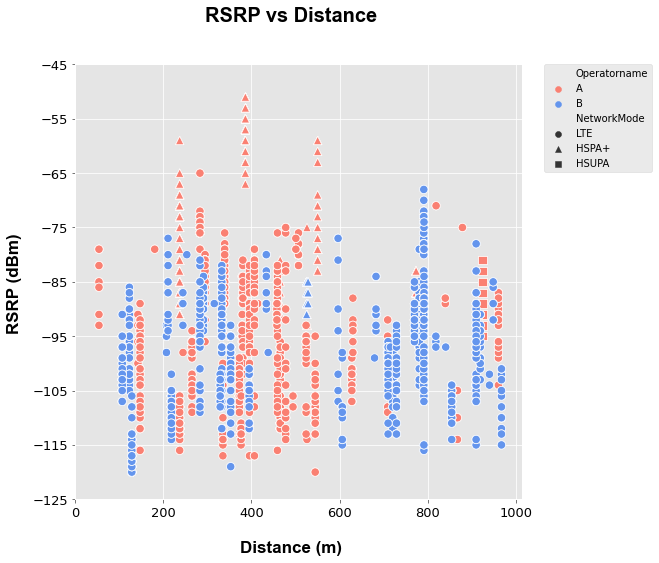

In [17]:
plt.style.use('ggplot')
#sns.set_style('darkgrid')
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
sns.scatterplot(data=ab.loc[ab['Distance'] < 1000, :], x='Distance', y='RSRP', 
                hue='Operatorname', palette={'A':'salmon', 'B':'cornflowerblue'},
                style='NetworkMode', markers = {'LTE': 'o', 'HSPA+': '^', 'HSUPA':'s'}, s=70)
ax.set(xlabel='', ylabel='')
fig.suptitle('RSRP vs Distance', fontname="Arial", fontsize=20, fontweight='bold')
fig.text(0.5, 0.04, 'Distance (m)', ha='center', va='center', fontname="Arial", fontsize=17, fontweight='bold')
fig.text(0.02, 0.5, 'RSRP (dBm)', ha='center', va='center', fontname="Arial", rotation='vertical', fontsize=17, fontweight='bold')
#ax.yaxis.get_label().set_fontsize(15)
#ax.yaxis.label.set_color('#51585E')
#ax.tick_params('x', labelrotation=50)
#ax.tick_params('y', labelrotation=50)
ax.set_xticks(np.arange(0, 1200, step=200))
ax.set_yticks(np.arange(-125, -40, step=10))
#ax.set_xticks(np.arange(0, 650, step=50))
#ax.set_yticklabels((), color='k', size=13)
#ax.set_xticklabels((), color='k', size=13);
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.setp(ax.get_xticklabels(), color="black", size=13)
plt.setp(ax.get_yticklabels(), color="black", size=13);